# Base de Datos 2 Modelo 3

## CARGA DE DATOS

In [1]:
import weka.core.jvm as jvm
from weka.core.converters import Loader
from weka.core.converters import load_any_file
from weka.core.converters import save_any_file
import weka.core.converters as converters
from weka.filters import Filter
import pandas as pd
from weka.core.dataset import Instances

import warnings
warnings.filterwarnings("ignore")

In [2]:
jvm.start(system_cp=True, packages=True, max_heap_size="15g")

DEBUG:weka.core.jvm:Adding bundled jars
DEBUG:weka.core.jvm:Adding system classpath
DEBUG:weka.core.jvm:Classpath=['/home/pablo/TFG_dir/TFG_env/lib/python3.8/site-packages/javabridge/jars/rhino-1.7R4.jar', '/home/pablo/TFG_dir/TFG_env/lib/python3.8/site-packages/javabridge/jars/runnablequeue.jar', '/home/pablo/TFG_dir/TFG_env/lib/python3.8/site-packages/javabridge/jars/cpython.jar', '/home/pablo/TFG_dir/TFG_env/lib/python3.8/site-packages/weka/lib/weka.jar', '/home/pablo/TFG_dir/TFG_env/lib/python3.8/site-packages/weka/lib/python-weka-wrapper.jar']
DEBUG:weka.core.jvm:MaxHeapSize=15g
DEBUG:weka.core.jvm:Package support enabled


In [3]:
data_dir = "/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/"

In [4]:
loader = Loader(classname="weka.core.converters.ArffLoader")
data_modelo_3 = loader.load_file(data_dir + "Base de datos modelo 3.arff")
data_modelo_3.class_is_last()

print(data_modelo_3)

@relation 'FJRP-weka.filters.unsupervised.attribute.Add-TNOM-N12months_History_Injury_SoftTissue_>8days_FAR-LSoft-tissue,No-C232-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-N12months_History_Injury_SoftTissue_>AnyTimeLoss_FAR-LSoft-tissue,No-C231-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_FPPA_D_discr-L0,1,2,3-C212-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_FPPA_ND_discr-L0,1,2,3-C214-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_D_discr-LVaro,Valgus-C220-W1.0-weka.filters.unsupervised.attribute.Remove-R220-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_D_discr-L0,1,2,3-C220-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_ND_discr-L0,1,2,3-C222-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_Knee-to-ankle-ratio_discr-LVaro,Valgus-C219-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NSLCMJ-Height_ND_discr-L-9.88,+9.88-C1

In [5]:
def arff2csv(arff_path, csv_path=None):
    with open(arff_path, 'r') as fr:
        attributes = []
        if csv_path is None:
            csv_path = arff_path[:-4] + 'csv'  # *.arff -> *.csv
        write_sw = False
        with open(csv_path, 'w') as fw:
            for line in fr.readlines():
                if write_sw:
                    fw.write(line)
                elif '@data' in line:
                    fw.write(','.join(attributes) + '\n')
                    write_sw = True
                elif '@attribute' in line:
                    attributes.append(line.split(' ')[1])  # @attribute attribute_tag numeric

        print("Convert {} to {}.".format(arff_path, csv_path))

In [6]:
input_file = "/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/Base de datos modelo 3.arff"
output_file = None
arff2csv(input_file,output_file)

Convert /home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/Base de datos modelo 3.arff to /home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/Base de datos modelo 3.csv.


In [7]:
filepath = "/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/Base de datos modelo 3.csv"
index = None
target = "Soft-Tissue_injury_≥4days"

data_modelo_3_csv = pd.read_csv(filepath, index_col=index)
data_modelo_3_csv[target] = data_modelo_3_csv[target].astype("category")

data_modelo_3_csv

,DVJ_Valgus_KneeMedialDisplacement_D_discr,BMI,AgeGroup,ROM-PADF-KE_D,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,...,Height,ROM-PHADD_D,Age,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
0,0,18.716444,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,187.5,31,17.500000,4,26,4,60.101010,62.814070,13,No
1,0,22.182267,U17U19,41,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,190.5,31,17.500000,4,37,4,66.831683,67.079208,13,No
2,1,25.352783,U17U19,35,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,180.5,31,16.500000,4,31,4,53.608247,57.692308,13,No
3,0,21.332873,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,178.8,31,16.871233,4,32,4,61.052632,57.291667,13,No
4,0,23.085619,U17U19,25,0,4,1,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,171.5,31,16.087671,4,28,4,57.471264,55.769231,13,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0,26.841821,U17U19,34,0,4,2,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,...,179.1,24,17.569863,9,36,9,60.317460,60.317460,13,No
256,1,22.079395,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,172.5,31,16.958904,2,31,0,60.860215,61.290323,12,Yes
257,0,22.944419,U17U19,28,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,170.5,28,16.380822,6,24,2,57.777778,55.277778,16,No
258,1,22.566588,U17U19,32,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,176.5,30,18.167123,7,30,6,59.375000,63.020833,15,No


## VISUALIZACION DE DATOS

In [8]:
import matplotlib
from matplotlib import style
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import seaborn as sns

import numpy as np

from sklearn.preprocessing import LabelEncoder

In [9]:
plt.rcParams['image.cmap'] = "bwr"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

sns.set_palette("vlag")

In [10]:
data_modelo_3_csv.sample(5)

,DVJ_Valgus_KneeMedialDisplacement_D_discr,BMI,AgeGroup,ROM-PADF-KE_D,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,...,Height,ROM-PHADD_D,Age,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
231,0,18.752593,U11U12,30,0,2,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,141.6,29,11.652055,5,30,5,62.162162,63.513514,12,No
256,1,22.079395,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,172.5,31,16.958904,2,31,0,60.860215,61.290323,12,Yes
220,0,20.324611,U15U16,30,0,3,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,169.8,32,15.372603,8,32,6,59.550562,65.363128,14,No
16,1,17.598098,U11U12,34,1,3,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,...,145.0,30,10.928767,1,32,0,64.473684,67.532468,15,No
43,1,18.145660,U11U12,26,1,3,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,...,152.5,26,11.350685,4,30,4,59.281437,64.880952,13,No


In [11]:
data_modelo_3_csv.info(memory_usage=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260 entries, 0 to 259
Data columns (total 62 columns):
 #   Column                                              Non-Null Count  Dtype   
---  ------                                              --------------  -----   
 0   DVJ_Valgus_KneeMedialDisplacement_D_discr           260 non-null    int64   
 1   BMI                                                 260 non-null    float64 
 2   AgeGroup                                            260 non-null    object  
 3   ROM-PADF-KE_D                                       260 non-null    int64   
 4   DVJ_Valgus_FPPA_D_discr                             260 non-null    int64   
 5   TrainFrequency                                      260 non-null    int64   
 6   DVJ_Valgus_FPPA_ND_discr                            260 non-null    int64   
 7   Asym_SLCMJLanding-pVGRF(10percent)_discr            260 non-null    object  
 8   Asym-ROM-PHIR(≥8)_discr                             260 non-null    ob

In [12]:
data_modelo_3_csv.shape

(260, 62)

In [13]:
data_modelo_3_csv.isna().sum().sort_values()

DVJ_Valgus_KneeMedialDisplacement_D_discr             0
Asym_SLCMJ-pLFT(10percent)_discr                      0
DominantLeg                                           0
Asym-ROM-PADF-KF(≥8)_discr                            0
ROM-PHER_ND                                           0
                                                     ..
Asym(>4cm)-DVJ_Valgus_Knee;edialDisplacement_discr    0
Asym_SLCMJTakeOff-pVGRF(10percent)_discr              0
Asym-ROM-PHADD(≥8)_discr                              0
Position                                              0
Soft-Tissue_injury_≥4days                             0
Length: 62, dtype: int64

In [14]:
data_modelo_3_csv.select_dtypes(include = ['category']).describe()

,Soft-Tissue_injury_≥4days
count,260
unique,2
top,No
freq,215


### Variable Clase

Text(0.5, 0.98, 'Distribución Variable Categórica')

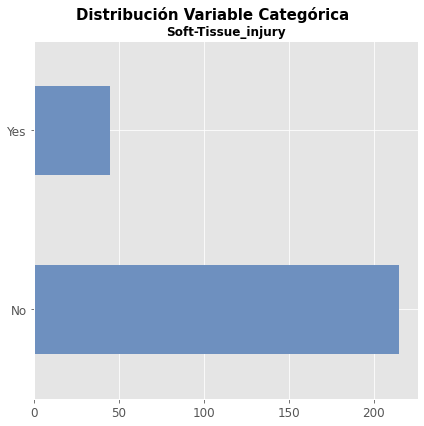

In [15]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6, 6))
ax = ax

data_modelo_3_csv["Soft-Tissue_injury_≥4days"].value_counts().plot.barh(ax = ax)
ax.set_title('Soft-Tissue_injury', fontsize = 12, fontweight = "bold")
ax.tick_params(labelsize = 12)
ax.set_xlabel("")

fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('Distribución Variable Categórica', fontsize = 15, fontweight = "bold")

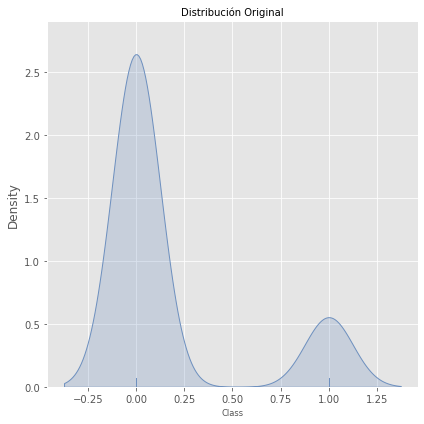

In [16]:
label_encoder = LabelEncoder()
data_modelo_3_csv_class_encoded = label_encoder.fit_transform(data_modelo_3_csv["Soft-Tissue_injury_≥4days"])

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (6, 6))
sns.distplot(
    data_modelo_3_csv_class_encoded,
    hist = False,
    rug = True,
    kde_kws = {'shade': True, 'linewidth':1},
    ax = axes)

axes.set_title("Distribución Original", fontsize = 'medium')
axes.set_xlabel("Class", fontsize = 'small')
axes.tick_params(labelsize = 10)

fig.tight_layout()

### Variables Numericas

In [17]:
data_modelo_3_csv.select_dtypes(include = ['float64', 'int']).describe()

,DVJ_Valgus_KneeMedialDisplacement_D_discr,BMI,ROM-PADF-KE_D,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,TJ_Valgus_FPPA_ND_discr,TJ_Valgus_FPPA_D_discr,DVJ_Valgus_KneeMedialDisplacement_ND_discr,ROM-PHER_ND,...,ROM-PHADD_ND,Height,ROM-PHADD_D,Age,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000
mean,0.911538,19.934551,30.307692,0.584615,3.134615,0.473077,1.423077,1.461538,1.111538,57.773077,...,29.373077,163.623077,28.842308,13.937387,4.430769,30.065385,3.953846,62.187072,62.524453,13.150000
std,0.788345,2.625108,4.516544,0.753726,0.577200,0.677297,0.784654,0.811632,0.795172,7.056203,...,3.810578,13.447272,3.875741,2.393454,3.468420,4.414739,2.735048,5.671111,5.584099,2.037439
min,0.000000,13.639753,20.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,40.000000,...,20.000000,136.300000,18.000000,10.076712,0.000000,18.000000,0.000000,47.938144,45.959596,5.000000
25%,0.000000,18.252914,28.000000,0.000000,3.000000,0.000000,1.000000,1.000000,1.000000,54.000000,...,26.000000,151.575000,26.000000,11.602740,2.000000,26.000000,2.000000,58.333333,58.864469,12.000000
50%,1.000000,19.937457,30.000000,0.000000,3.000000,0.000000,1.000000,2.000000,1.000000,58.000000,...,29.000000,165.000000,29.000000,13.575343,4.000000,30.000000,4.000000,61.793535,62.608382,13.000000
75%,1.000000,21.647451,33.000000,1.000000,3.000000,1.000000,2.000000,2.000000,2.000000,62.000000,...,32.000000,174.000000,31.000000,15.708219,6.000000,32.000000,5.000000,66.118144,65.960232,15.000000
max,3.000000,27.268714,48.000000,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,80.000000,...,42.000000,193.000000,40.000000,18.657534,19.000000,48.000000,15.000000,76.875000,80.000000,16.000000


In [18]:
nums = data_modelo_3_csv.select_dtypes(include = ['float64', 'int']).columns

for colum in nums:
    if len(data_modelo_3_csv[colum].unique()) < 5:
        data_modelo_3_csv[colum] = data_modelo_3_csv[colum].apply(str)
        print(colum, "ha sido transformada a categorica por el bajo numero de valores")

DVJ_Valgus_KneeMedialDisplacement_D_discr ha sido transformada a categorica por el bajo numero de valores
DVJ_Valgus_FPPA_D_discr ha sido transformada a categorica por el bajo numero de valores
TrainFrequency ha sido transformada a categorica por el bajo numero de valores
DVJ_Valgus_FPPA_ND_discr ha sido transformada a categorica por el bajo numero de valores
TJ_Valgus_FPPA_ND_discr ha sido transformada a categorica por el bajo numero de valores
TJ_Valgus_FPPA_D_discr ha sido transformada a categorica por el bajo numero de valores
DVJ_Valgus_KneeMedialDisplacement_ND_discr ha sido transformada a categorica por el bajo numero de valores


Text(0.5, 0.98, 'Distribución Variables Numéricas')

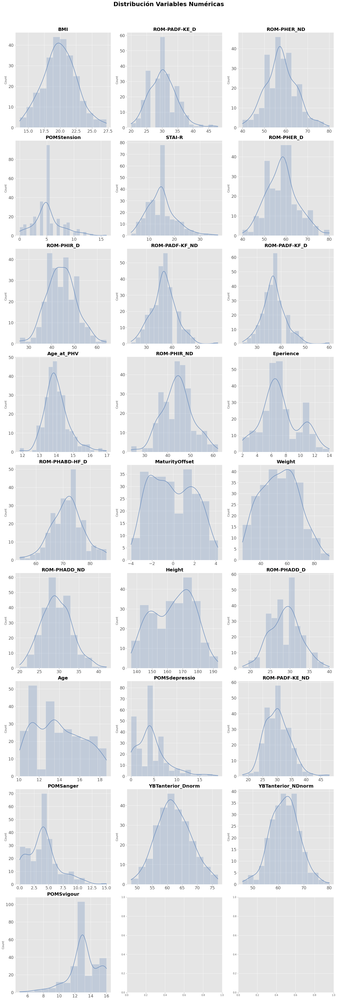

In [19]:
fig, axes = plt.subplots(nrows = 9, ncols = 3, figsize = (20, 60))
axes = axes.flat
columnas_numeric = data_modelo_3_csv.select_dtypes(include = ['float64', 'int']).columns

for i, colum in enumerate(columnas_numeric):
    
    sns.histplot(
        data = data_modelo_3_csv,
        x = colum,
        stat = "count",
        kde = True,
        line_kws = {'linewidth': 2},
        alpha = 0.3,
        ax = axes[i])
    
    axes[i].set_title(colum, fontsize = 20, fontweight = "bold")
    axes[i].tick_params(labelsize = 18)
    axes[i].set_xlabel("")
    
fig.tight_layout()
plt.subplots_adjust(top = 0.95)
fig.suptitle('Distribución Variables Numéricas', fontsize = 25, fontweight = "bold")

In [20]:
corr_matrix = data_modelo_3_csv[columnas_numeric].corr()
corr_matrix

,BMI,ROM-PADF-KE_D,ROM-PHER_ND,POMStension,STAI-R,ROM-PHER_D,ROM-PHIR_D,ROM-PADF-KF_ND,ROM-PADF-KF_D,Age_at_PHV,...,ROM-PHADD_ND,Height,ROM-PHADD_D,Age,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
BMI,1.000000,0.175249,-0.010802,-0.023707,0.062074,-0.014926,-0.393021,-0.116729,-0.134291,0.161114,...,0.044340,0.585564,0.013324,0.584635,0.048944,0.096747,0.038064,-0.275106,-0.265173,-0.052121
ROM-PADF-KE_D,0.175249,1.000000,0.041452,0.009781,-0.048143,0.080676,0.058694,0.401219,0.454819,0.022291,...,0.392626,0.207900,0.291283,0.229115,-0.035112,0.776247,0.007093,0.097170,0.126308,-0.090628
ROM-PHER_ND,-0.010802,0.041452,1.000000,0.079210,0.032449,0.816278,0.110888,0.136453,0.055935,0.019073,...,-0.030871,-0.054259,-0.008231,-0.033155,0.041241,0.037537,0.114091,0.103577,0.060375,-0.035759
POMStension,-0.023707,0.009781,0.079210,1.000000,0.317446,0.011248,0.075430,-0.001601,0.022141,-0.004843,...,-0.047960,-0.016219,-0.025359,0.002218,0.429529,0.015274,0.516660,0.028702,0.085713,0.129249
STAI-R,0.062074,-0.048143,0.032449,0.317446,1.000000,-0.047413,0.041917,-0.140623,-0.088971,0.036111,...,-0.049963,0.028411,-0.067770,0.048217,0.371146,-0.015068,0.311301,-0.057826,-0.058507,-0.188903
ROM-PHER_D,-0.014926,0.080676,0.816278,0.011248,-0.047413,1.000000,0.058559,0.189427,0.100113,0.066012,...,-0.014820,-0.068546,0.074929,-0.006824,-0.025617,0.074510,0.059592,0.064199,0.033166,-0.022678
ROM-PHIR_D,-0.393021,0.058694,0.110888,0.075430,0.041917,0.058559,1.000000,0.156085,0.238317,-0.194274,...,0.061014,-0.296807,0.138243,-0.305884,0.020914,0.101112,0.014230,0.286595,0.257244,0.052133
ROM-PADF-KF_ND,-0.116729,0.401219,0.136453,-0.001601,-0.140623,0.189427,0.156085,1.000000,0.804610,-0.052034,...,0.244055,0.012514,0.269328,0.005611,-0.063433,0.489794,-0.049527,0.418573,0.497302,0.095848
ROM-PADF-KF_D,-0.134291,0.454819,0.055935,0.022141,-0.088971,0.100113,0.238317,0.804610,1.000000,-0.094398,...,0.241501,-0.039057,0.244064,-0.052706,-0.014336,0.478315,-0.059665,0.467735,0.478686,0.086794
Age_at_PHV,0.161114,0.022291,0.019073,-0.004843,0.036111,0.066012,-0.194274,-0.052034,-0.094398,1.000000,...,0.108165,0.175852,0.168894,0.616177,-0.005673,0.021456,0.112695,-0.056957,-0.097484,-0.027222


In [21]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (250, 250))
sns.heatmap(
    corr_matrix,
    annot = True,
    cbar = False,
    annot_kws = {"size": 100},
    vmin = -1,
    vmax = 1,
    center = 0,
    cmap = sns.color_palette("vlag_r"),
    square = True,
    ax = ax)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right')

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation = 0,
    horizontalalignment = 'right')

ax.tick_params(labelsize = 180)

In [22]:
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(np.bool))
upper_tri

,BMI,ROM-PADF-KE_D,ROM-PHER_ND,POMStension,STAI-R,ROM-PHER_D,ROM-PHIR_D,ROM-PADF-KF_ND,ROM-PADF-KF_D,Age_at_PHV,...,ROM-PHADD_ND,Height,ROM-PHADD_D,Age,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
BMI,NaN,0.175249,-0.010802,-0.023707,0.062074,-0.014926,-0.393021,-0.116729,-0.134291,0.161114,...,0.044340,0.585564,0.013324,0.584635,0.048944,0.096747,0.038064,-0.275106,-0.265173,-0.052121
ROM-PADF-KE_D,NaN,NaN,0.041452,0.009781,-0.048143,0.080676,0.058694,0.401219,0.454819,0.022291,...,0.392626,0.207900,0.291283,0.229115,-0.035112,0.776247,0.007093,0.097170,0.126308,-0.090628
ROM-PHER_ND,NaN,NaN,NaN,0.079210,0.032449,0.816278,0.110888,0.136453,0.055935,0.019073,...,-0.030871,-0.054259,-0.008231,-0.033155,0.041241,0.037537,0.114091,0.103577,0.060375,-0.035759
POMStension,NaN,NaN,NaN,NaN,0.317446,0.011248,0.075430,-0.001601,0.022141,-0.004843,...,-0.047960,-0.016219,-0.025359,0.002218,0.429529,0.015274,0.516660,0.028702,0.085713,0.129249
STAI-R,NaN,NaN,NaN,NaN,NaN,-0.047413,0.041917,-0.140623,-0.088971,0.036111,...,-0.049963,0.028411,-0.067770,0.048217,0.371146,-0.015068,0.311301,-0.057826,-0.058507,-0.188903
ROM-PHER_D,NaN,NaN,NaN,NaN,NaN,NaN,0.058559,0.189427,0.100113,0.066012,...,-0.014820,-0.068546,0.074929,-0.006824,-0.025617,0.074510,0.059592,0.064199,0.033166,-0.022678
ROM-PHIR_D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.156085,0.238317,-0.194274,...,0.061014,-0.296807,0.138243,-0.305884,0.020914,0.101112,0.014230,0.286595,0.257244,0.052133
ROM-PADF-KF_ND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.804610,-0.052034,...,0.244055,0.012514,0.269328,0.005611,-0.063433,0.489794,-0.049527,0.418573,0.497302,0.095848
ROM-PADF-KF_D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.094398,...,0.241501,-0.039057,0.244064,-0.052706,-0.014336,0.478315,-0.059665,0.467735,0.478686,0.086794
Age_at_PHV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.108165,0.175852,0.168894,0.616177,-0.005673,0.021456,0.112695,-0.056957,-0.097484,-0.027222


In [23]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(to_drop)

['Age']


In [24]:
data_modelo_3_csv = data_modelo_3_csv.drop(to_drop, axis = 1)
data_modelo_3_csv.head()

,DVJ_Valgus_KneeMedialDisplacement_D_discr,BMI,AgeGroup,ROM-PADF-KE_D,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,...,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
0,0,18.716444,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,187.5,31,4,26,4,60.101010,62.814070,13,No
1,0,22.182267,U17U19,41,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,190.5,31,4,37,4,66.831683,67.079208,13,No
2,1,25.352783,U17U19,35,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,180.5,31,4,31,4,53.608247,57.692308,13,No
3,0,21.332873,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,178.8,31,4,32,4,61.052632,57.291667,13,No
4,0,23.085619,U17U19,25,0,4,1,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,171.5,31,4,28,4,57.471264,55.769231,13,Yes


### Variables Categoricas

In [25]:
data_modelo_3_csv.select_dtypes(include=['object']).describe()

,DVJ_Valgus_KneeMedialDisplacement_D_discr,AgeGroup,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,TJ_Valgus_FPPA_ND_discr,Asym-ROM-PHF-KE(≥8)_discr,...,Asym-ROM-PHADD(≥8)_discr,Asym-YBTcomposite(10percent)_discr,Asym_SingleHop(10percent)_discr,Asym_YBTpm(10percent)_discr,Asym_DVJ_Valgus_FPPA(10percent)_discr,Asym_SLCMJ-pLFT(10percent)_discr,DominantLeg,Asym-ROM-PADF-KF(≥8)_discr,CPRDmentalskills,CPRDtcohesion
count,260,260,260,260,260,260,260,260,260,260,...,260,260,260,260,260,260,260,260,260,260
unique,4,4,4,3,4,2,2,2,4,2,...,2,2,2,2,2,2,2,2,18,15
top,1,U11U12,0,3,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,2,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,?,19
freq,130,78,146,169,162,165,247,249,110,235,...,250,253,205,233,242,132,190,254,78,80


Text(0.5, 0.98, 'Distribución Variables Categóricas')

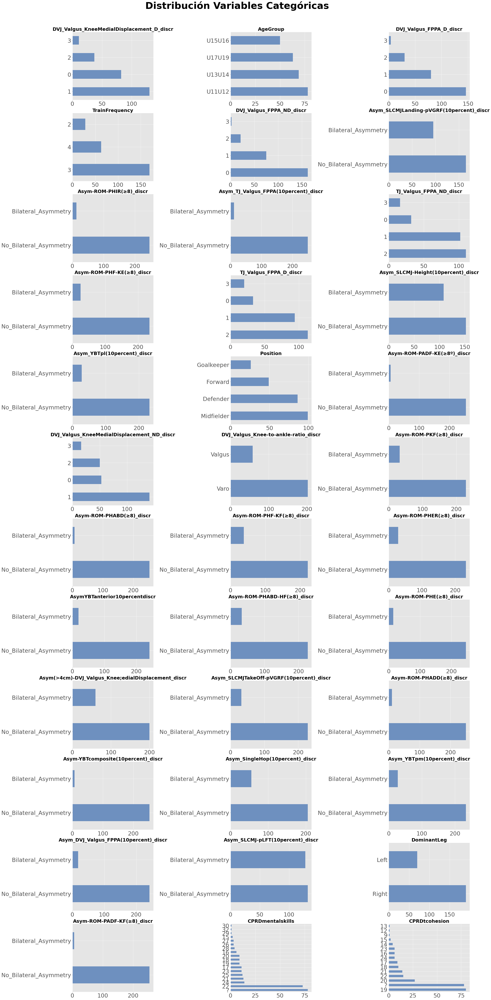

In [26]:
fig, axes = plt.subplots(nrows = 12, ncols = 3, figsize = (35, 75))
axes = axes.flat
columnas_object = data_modelo_3_csv.select_dtypes(include = ['object']).columns

for i, colum in enumerate(columnas_object):
        data_modelo_3_csv[colum].value_counts().plot.barh(ax = axes[i])
        axes[i].set_title(colum, fontsize = 25, fontweight = "bold")
        axes[i].tick_params(labelsize = 30)
        axes[i].set_xlabel("")

fig.tight_layout()
plt.subplots_adjust(top = 0.95)
fig.suptitle('Distribución Variables Categóricas', fontsize = 50, fontweight = "bold")

## VISUALIZACION DE LAS RELACIONES ENTRE LOS DATOS

In [27]:
filter1_Soft_Tissue_injury = data_modelo_3_csv["Soft-Tissue_injury_≥4days"].isin(["No"])
filter2_Soft_Tissue_injury = data_modelo_3_csv["Soft-Tissue_injury_≥4days"].isin(["Yes"])

No_injury = data_modelo_3_csv[filter1_Soft_Tissue_injury]
Yes_injury = data_modelo_3_csv[filter2_Soft_Tissue_injury]

In [28]:
def funcion_No_injury(a, colum):
    x = []
    for i in a:
        x.append(No_injury[colum].value_counts()[i])
    return x

def funcion_Yes_injury(a, colum):
    x = []
    for i in a:
        x.append(Yes_injury[colum].value_counts()[i])
    return x

### Relacion Entre Variables Categoricas y la Clase

Text(0.5, 0.98, 'Distribución Variables Categóricas con respecto la clase')

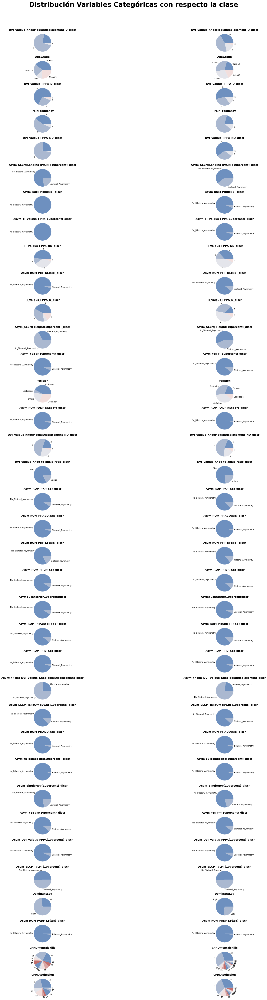

In [29]:
fig, axes = plt.subplots(nrows = 36, ncols = 2, figsize = (35, 75))
axes = axes.flat


columnas_object = data_modelo_3_csv.select_dtypes(include = ['object']).columns

for i, colum in enumerate(columnas_object):
    
    yes = funcion_Yes_injury(Yes_injury[colum].unique(), colum)
    no = funcion_No_injury(No_injury[colum].unique(), colum)  
    
    axes[i*2].pie(yes, labels = Yes_injury[colum].unique())
    axes[i*2].set_title(colum, fontsize = 14, fontweight = "bold")
    axes[i*2].tick_params(labelsize = 15)
    axes[i*2].set_xlabel("")
            
    axes[(i*2)+1].pie(no, labels = No_injury[colum].unique())
    axes[(i*2)+1].set_title(colum, fontsize = 14, fontweight = "bold")
    axes[(i*2)+1].tick_params(labelsize = 15)
    axes[(i*2)+1].set_xlabel("")    

fig.tight_layout()
plt.subplots_adjust(top = 0.95)
fig.suptitle('Distribución Variables Categóricas con respecto la clase', fontsize = 35, fontweight = "bold")

### Relacion Entre Variables Numericas y la Clase

Text(0.5, 0.98, 'Distribución Variables Numéricas con respecto la clase')

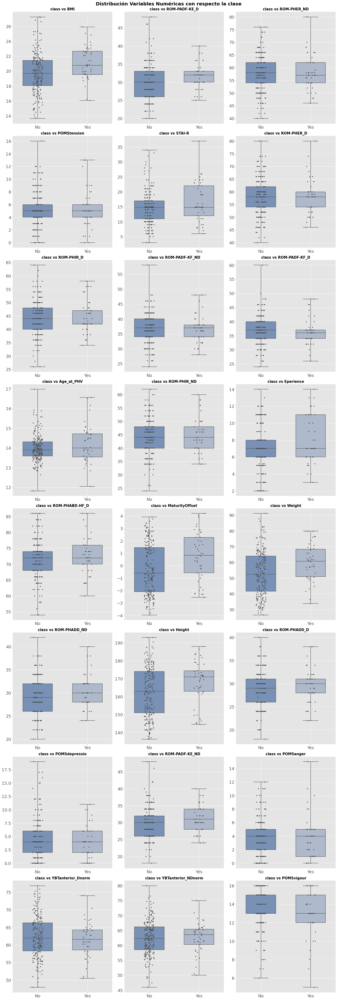

In [30]:
fig, axes = plt.subplots(nrows = 8, ncols = 3, figsize = (20, 60))
axes = axes.flat
columnas_numeric = data_modelo_3_csv.select_dtypes(include = ['float64', 'int']).columns


for i, colum in enumerate(columnas_numeric):
    sns.boxplot(x="Soft-Tissue_injury_≥4days", y=colum,data = data_modelo_3_csv,
                whis=[0, 100], width=.6, ax = axes[i])

    sns.stripplot(x="Soft-Tissue_injury_≥4days", y=colum,data = data_modelo_3_csv,
                  size=4, color=".3", linewidth=0, ax = axes[i])
    
    axes[i].set_title(f"class vs {colum}", fontsize = 15, fontweight = "bold")
    axes[i].yaxis.grid(True)
    axes[i].xaxis.grid(True)
    axes[i].tick_params(labelsize = 18)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    
sns.despine(trim=True, left=True)

fig.tight_layout()
plt.subplots_adjust(top = 0.97)
fig.suptitle('Distribución Variables Numéricas con respecto la clase', fontsize = 20, fontweight = "bold")

### Preprocesamiento

In [31]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [32]:
data_modelo_3_csv = data_modelo_3_csv.replace({'?': '-1'})
X = data_modelo_3_csv.drop('Soft-Tissue_injury_≥4days', axis = 'columns')
y = data_modelo_3_csv['Soft-Tissue_injury_≥4days']

### Binarización de las variables cualitativas

In [33]:
cat_cols = X.select_dtypes(include=['object', 'category'])
numeric_cols = X.select_dtypes(include=['float64', 'int'])

In [34]:
cat_cols

,DVJ_Valgus_KneeMedialDisplacement_D_discr,AgeGroup,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,TJ_Valgus_FPPA_ND_discr,Asym-ROM-PHF-KE(≥8)_discr,...,Asym-ROM-PHADD(≥8)_discr,Asym-YBTcomposite(10percent)_discr,Asym_SingleHop(10percent)_discr,Asym_YBTpm(10percent)_discr,Asym_DVJ_Valgus_FPPA(10percent)_discr,Asym_SLCMJ-pLFT(10percent)_discr,DominantLeg,Asym-ROM-PADF-KF(≥8)_discr,CPRDmentalskills,CPRDtcohesion
0,0,U17U19,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,22,19
1,0,U17U19,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,22,19
2,1,U17U19,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,0,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,22,19
3,0,U17U19,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,22,19
4,0,U17U19,0,4,1,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Left,No_Bilateral_Asymmetry,22,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0,U17U19,0,4,2,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,2,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,22,19
256,1,U17U19,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,24,24
257,0,U17U19,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,1,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,18,19
258,1,U17U19,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,0,No_Bilateral_Asymmetry,...,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,Right,No_Bilateral_Asymmetry,20,22


In [35]:
encoder = OneHotEncoder(categories = 'auto', drop = 'first', handle_unknown = 'ignore')
cat_cols_encoded_DF = pd.DataFrame(encoder.fit_transform(cat_cols).toarray(), columns = encoder.get_feature_names_out())
cat_cols_encoded_DF

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,CPRDtcohesion_16,CPRDtcohesion_17,CPRDtcohesion_18,CPRDtcohesion_19,CPRDtcohesion_20,CPRDtcohesion_21,CPRDtcohesion_22,CPRDtcohesion_23,CPRDtcohesion_24,CPRDtcohesion_9
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
257,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
258,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [36]:
X_numeric = pd.concat([cat_cols_encoded_DF, numeric_cols], axis = 1)
X_numeric

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,65.8,32,187.5,31,4,26,4,60.101010,62.814070,13
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,80.5,32,190.5,31,4,37,4,66.831683,67.079208,13
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,82.6,32,180.5,31,4,31,4,53.608247,57.692308,13
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,68.2,32,178.8,31,4,32,4,61.052632,57.291667,13
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,67.9,32,171.5,31,4,28,4,57.471264,55.769231,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,86.1,28,179.1,24,9,36,9,60.317460,60.317460,13
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,65.7,32,172.5,31,2,31,0,60.860215,61.290323,12
257,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,66.7,28,170.5,28,6,24,2,57.777778,55.277778,16
258,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,70.3,28,176.5,30,7,30,6,59.375000,63.020833,15


In [37]:
le = LabelEncoder()
y_binary = le.fit_transform(y)
y_binary = pd.DataFrame(y_binary, columns = [y.name])
y_binary

,Soft-Tissue_injury_≥4days
0,0
1,0
2,0
3,0
4,1
...,...
255,0
256,1
257,0
258,0


In [38]:
# Reparto de datos en train y test
# ==============================================================================
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                        X_numeric,
                                        y_binary,
                                        train_size   = 0.7,
                                        random_state = 1234,
                                        shuffle      = True,
                                        stratify = y_binary
                                    )

### Estandarización y escalado de variables numéricas

In [39]:
from sklearn.preprocessing import MinMaxScaler

In [40]:
scaler = MinMaxScaler()
X_train[:] = scaler.fit_transform(X_train)
X_train

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
127,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.860884,0.363636,0.714286,0.545455,0.052632,0.400000,0.133333,0.284056,0.199613,0.454545
219,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.448445,0.454545,0.448214,0.545455,0.526316,0.400000,0.733333,0.305482,0.214646,0.818182
121,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.502455,0.363636,0.642857,0.454545,0.315789,0.266667,0.333333,0.512175,0.493768,0.909091
204,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.224223,0.363636,0.416071,0.545455,0.631579,0.600000,0.666667,0.589074,0.480984,1.000000
100,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.417349,0.636364,0.508929,0.636364,0.210526,0.466667,0.200000,0.627523,0.606264,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.571195,0.545455,0.494643,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.363636
89,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.433715,0.454545,0.517857,0.090909,0.263158,0.200000,0.133333,0.225534,0.326419,0.818182
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.219313,0.272727,0.178571,0.454545,0.000000,0.333333,0.000000,0.584693,0.410755,0.181818
224,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.363339,0.409091,0.142857,0.500000,0.421053,0.400000,0.133333,0.182360,0.472849,0.272727


In [41]:
X_test[:] = scaler.transform(X_test)
X_test

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
202,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.353519,0.272727,0.232143,0.454545,0.000000,0.333333,0.266667,0.799618,0.460500,0.909091
185,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.170213,0.272727,0.187500,0.272727,0.210526,0.466667,0.266667,0.467636,0.423736,0.454545
247,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.671031,0.454545,0.707143,0.272727,0.000000,0.533333,0.066667,0.430470,0.263663,0.636364
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.973813,0.363636,0.751786,0.272727,0.473684,0.600000,0.600000,0.427037,0.365932,0.727273
138,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.518822,0.545455,0.666071,0.727273,0.315789,0.400000,0.333333,0.374223,0.476068,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.716858,0.181818,0.607143,0.363636,0.473684,0.266667,0.200000,0.384594,0.253203,0.818182
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.639935,0.545455,0.633929,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.636364
220,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.523732,0.545455,0.585714,0.636364,0.421053,0.466667,0.400000,0.400499,0.528477,0.818182
36,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.072013,0.272727,-0.012500,0.545455,0.315789,0.333333,0.266667,0.735477,0.246085,0.636364


### Imputación de valores ausentes

In [42]:
X_train.isna().sum().sort_values()

DVJ_Valgus_KneeMedialDisplacement_D_discr_1           0
CPRDtcohesion_20                                      0
CPRDtcohesion_19                                      0
CPRDtcohesion_18                                      0
CPRDtcohesion_17                                      0
                                                     ..
DVJ_Valgus_KneeMedialDisplacement_ND_discr_1          0
Asym-ROM-PADF-KE(≥8º)_discr_No_Bilateral_Asymmetry    0
Position_Midfielder                                   0
Position_Forward                                      0
POMSvigour                                            0
Length: 106, dtype: int64

In [43]:
X_test.isna().sum().sort_values()

DVJ_Valgus_KneeMedialDisplacement_D_discr_1           0
CPRDtcohesion_20                                      0
CPRDtcohesion_19                                      0
CPRDtcohesion_18                                      0
CPRDtcohesion_17                                      0
                                                     ..
DVJ_Valgus_KneeMedialDisplacement_ND_discr_1          0
Asym-ROM-PADF-KE(≥8º)_discr_No_Bilateral_Asymmetry    0
Position_Midfielder                                   0
Position_Forward                                      0
POMSvigour                                            0
Length: 106, dtype: int64

In [44]:
y_train.isna().sum().sort_values()

Soft-Tissue_injury_≥4days    0
dtype: int64

In [45]:
y_test.isna().sum().sort_values()

Soft-Tissue_injury_≥4days    0
dtype: int64

### Exclusión de variables con varianza próxima a cero

In [46]:
from sklearn.feature_selection import VarianceThreshold

In [47]:
selector = VarianceThreshold(threshold=0.0)
selector.fit_transform(X_train)
X_train = X_train[X_train.columns[selector.get_support(indices = True)]]
X_train

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
127,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.860884,0.363636,0.714286,0.545455,0.052632,0.400000,0.133333,0.284056,0.199613,0.454545
219,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.448445,0.454545,0.448214,0.545455,0.526316,0.400000,0.733333,0.305482,0.214646,0.818182
121,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.502455,0.363636,0.642857,0.454545,0.315789,0.266667,0.333333,0.512175,0.493768,0.909091
204,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.224223,0.363636,0.416071,0.545455,0.631579,0.600000,0.666667,0.589074,0.480984,1.000000
100,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.417349,0.636364,0.508929,0.636364,0.210526,0.466667,0.200000,0.627523,0.606264,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.571195,0.545455,0.494643,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.363636
89,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.433715,0.454545,0.517857,0.090909,0.263158,0.200000,0.133333,0.225534,0.326419,0.818182
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.219313,0.272727,0.178571,0.454545,0.000000,0.333333,0.000000,0.584693,0.410755,0.181818
224,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.363339,0.409091,0.142857,0.500000,0.421053,0.400000,0.133333,0.182360,0.472849,0.272727


In [48]:
selector.transform(X_test)
X_test = X_test[X_test.columns[selector.get_support(indices = True)]]
X_test

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
202,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.353519,0.272727,0.232143,0.454545,0.000000,0.333333,0.266667,0.799618,0.460500,0.909091
185,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.170213,0.272727,0.187500,0.272727,0.210526,0.466667,0.266667,0.467636,0.423736,0.454545
247,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.671031,0.454545,0.707143,0.272727,0.000000,0.533333,0.066667,0.430470,0.263663,0.636364
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.973813,0.363636,0.751786,0.272727,0.473684,0.600000,0.600000,0.427037,0.365932,0.727273
138,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.518822,0.545455,0.666071,0.727273,0.315789,0.400000,0.333333,0.374223,0.476068,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.716858,0.181818,0.607143,0.363636,0.473684,0.266667,0.200000,0.384594,0.253203,0.818182
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.639935,0.545455,0.633929,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.636364
220,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.523732,0.545455,0.585714,0.636364,0.421053,0.466667,0.400000,0.400499,0.528477,0.818182
36,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.072013,0.272727,-0.012500,0.545455,0.315789,0.333333,0.266667,0.735477,0.246085,0.636364


In [49]:
Data_train = pd.concat([X_train, y_train], axis = 1)
Data_test = pd.concat([X_test, y_test], axis = 1)

In [50]:
Data_train.to_csv(r'/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_modelo_3_csv_encoded_train.csv', index = False)
Data_test.to_csv(r'/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_modelo_3_csv_encoded_test.csv', index = False)

In [51]:
data_modelo_3

@relation 'FJRP-weka.filters.unsupervised.attribute.Add-TNOM-N12months_History_Injury_SoftTissue_>8days_FAR-LSoft-tissue,No-C232-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-N12months_History_Injury_SoftTissue_>AnyTimeLoss_FAR-LSoft-tissue,No-C231-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_FPPA_D_discr-L0,1,2,3-C212-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_FPPA_ND_discr-L0,1,2,3-C214-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_D_discr-LVaro,Valgus-C220-W1.0-weka.filters.unsupervised.attribute.Remove-R220-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_D_discr-L0,1,2,3-C220-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_KneeMedialDisplacement_ND_discr-L0,1,2,3-C222-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NDVJ_Valgus_Knee-to-ankle-ratio_discr-LVaro,Valgus-C219-W1.0-weka.filters.unsupervised.attribute.Add-TNOM-NSLCMJ-Height_ND_discr-L-9.88,+9.88-C1

In [52]:
data_modelo_3_csv

,DVJ_Valgus_KneeMedialDisplacement_D_discr,BMI,AgeGroup,ROM-PADF-KE_D,DVJ_Valgus_FPPA_D_discr,TrainFrequency,DVJ_Valgus_FPPA_ND_discr,Asym_SLCMJLanding-pVGRF(10percent)_discr,Asym-ROM-PHIR(≥8)_discr,Asym_TJ_Valgus_FPPA(10percent)_discr,...,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
0,0,18.716444,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,187.5,31,4,26,4,60.101010,62.814070,13,No
1,0,22.182267,U17U19,41,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,190.5,31,4,37,4,66.831683,67.079208,13,No
2,1,25.352783,U17U19,35,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,180.5,31,4,31,4,53.608247,57.692308,13,No
3,0,21.332873,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,178.8,31,4,32,4,61.052632,57.291667,13,No
4,0,23.085619,U17U19,25,0,4,1,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,171.5,31,4,28,4,57.471264,55.769231,13,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0,26.841821,U17U19,34,0,4,2,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,Bilateral_Asymmetry,...,28,179.1,24,9,36,9,60.317460,60.317460,13,No
256,1,22.079395,U17U19,33,0,4,0,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,32,172.5,31,2,31,0,60.860215,61.290323,12,Yes
257,0,22.944419,U17U19,28,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,28,170.5,28,6,24,2,57.777778,55.277778,16,No
258,1,22.566588,U17U19,32,0,4,0,Bilateral_Asymmetry,No_Bilateral_Asymmetry,No_Bilateral_Asymmetry,...,28,176.5,30,7,30,6,59.375000,63.020833,15,No


In [53]:
Data_train

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
127,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.363636,0.714286,0.545455,0.052632,0.400000,0.133333,0.284056,0.199613,0.454545,0
219,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.454545,0.448214,0.545455,0.526316,0.400000,0.733333,0.305482,0.214646,0.818182,0
121,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.363636,0.642857,0.454545,0.315789,0.266667,0.333333,0.512175,0.493768,0.909091,1
204,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.363636,0.416071,0.545455,0.631579,0.600000,0.666667,0.589074,0.480984,1.000000,0
100,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.636364,0.508929,0.636364,0.210526,0.466667,0.200000,0.627523,0.606264,0.727273,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.545455,0.494643,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.363636,1
89,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.454545,0.517857,0.090909,0.263158,0.200000,0.133333,0.225534,0.326419,0.818182,0
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.272727,0.178571,0.454545,0.000000,0.333333,0.000000,0.584693,0.410755,0.181818,0
224,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.409091,0.142857,0.500000,0.421053,0.400000,0.133333,0.182360,0.472849,0.272727,1


In [54]:
Data_test

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour,Soft-Tissue_injury_≥4days
202,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.272727,0.232143,0.454545,0.000000,0.333333,0.266667,0.799618,0.460500,0.909091,0
185,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.272727,0.187500,0.272727,0.210526,0.466667,0.266667,0.467636,0.423736,0.454545,0
247,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.454545,0.707143,0.272727,0.000000,0.533333,0.066667,0.430470,0.263663,0.636364,0
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.363636,0.751786,0.272727,0.473684,0.600000,0.600000,0.427037,0.365932,0.727273,0
138,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.545455,0.666071,0.727273,0.315789,0.400000,0.333333,0.374223,0.476068,0.727273,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.181818,0.607143,0.363636,0.473684,0.266667,0.200000,0.384594,0.253203,0.818182,0
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.545455,0.633929,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.636364,1
220,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.545455,0.585714,0.636364,0.421053,0.466667,0.400000,0.400499,0.528477,0.818182,0
36,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.272727,-0.012500,0.545455,0.315789,0.333333,0.266667,0.735477,0.246085,0.636364,0


In [55]:
data_train_modelo_3_arff_encoded = converters.load_any_file("/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_modelo_3_csv_encoded_train.csv")
data_train_modelo_3_arff_encoded.class_is_last()

f = Filter(classname="weka.filters.unsupervised.attribute.NumericToNominal", options=["-R", "104"])
f.inputformat(data_train_modelo_3_arff_encoded)
data_train_modelo_3_arff_encoded = f.filter(data_train_modelo_3_arff_encoded)

save_any_file(data_train_modelo_3_arff_encoded, "/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_train_modelo_3_arff_encoded.arff")
data_train_modelo_3_arff_encoded

@relation data_modelo_3_csv_encoded_train-weka.filters.unsupervised.attribute.NumericToNominal-R104

@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_1 numeric
@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_2 numeric
@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_3 numeric
@attribute AgeGroup_U13U14 numeric
@attribute AgeGroup_U15U16 numeric
@attribute AgeGroup_U17U19 numeric
@attribute DVJ_Valgus_FPPA_D_discr_1 numeric
@attribute DVJ_Valgus_FPPA_D_discr_2 numeric
@attribute DVJ_Valgus_FPPA_D_discr_3 numeric
@attribute TrainFrequency_3 numeric
@attribute TrainFrequency_4 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_1 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_2 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_3 numeric
@attribute Asym_SLCMJLanding-pVGRF(10percent)_discr_No_Bilateral_Asymmetry numeric
@attribute Asym-ROM-PHIR(≥8)_discr_No_Bilateral_Asymmetry numeric
@attribute Asym_TJ_Valgus_FPPA(10percent)_discr_No_Bilateral_Asymmetry numeric
@attribute TJ_Valgus_FPPA_ND_dis

In [56]:
data_test_modelo_3_arff_encoded = converters.load_any_file("/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_modelo_3_csv_encoded_test.csv")
data_test_modelo_3_arff_encoded.class_is_last()

f = Filter(classname="weka.filters.unsupervised.attribute.NumericToNominal", options=["-R", "104"])
f.inputformat(data_test_modelo_3_arff_encoded)
data_test_modelo_3_arff_encoded = f.filter(data_test_modelo_3_arff_encoded)

save_any_file(data_test_modelo_3_arff_encoded, "/home/pablo/Escritorio/TFG/Bases de Datos, Modelos y Esquemas/data_test_modelo_3_arff_encoded.arff")
data_test_modelo_3_arff_encoded

@relation data_modelo_3_csv_encoded_test-weka.filters.unsupervised.attribute.NumericToNominal-R104

@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_1 numeric
@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_2 numeric
@attribute DVJ_Valgus_KneeMedialDisplacement_D_discr_3 numeric
@attribute AgeGroup_U13U14 numeric
@attribute AgeGroup_U15U16 numeric
@attribute AgeGroup_U17U19 numeric
@attribute DVJ_Valgus_FPPA_D_discr_1 numeric
@attribute DVJ_Valgus_FPPA_D_discr_2 numeric
@attribute DVJ_Valgus_FPPA_D_discr_3 numeric
@attribute TrainFrequency_3 numeric
@attribute TrainFrequency_4 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_1 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_2 numeric
@attribute DVJ_Valgus_FPPA_ND_discr_3 numeric
@attribute Asym_SLCMJLanding-pVGRF(10percent)_discr_No_Bilateral_Asymmetry numeric
@attribute Asym-ROM-PHIR(≥8)_discr_No_Bilateral_Asymmetry numeric
@attribute Asym_TJ_Valgus_FPPA(10percent)_discr_No_Bilateral_Asymmetry numeric
@attribute TJ_Valgus_FPPA_ND_disc

## MODELOS

In [57]:
from weka.classifiers import Classifier, SingleClassifierEnhancer, AttributeSelectedClassifier

from weka.classifiers import FilteredClassifier

from weka.classifiers import MultiSearch
from weka.core.classes import MathParameter

from weka.core.classes import from_commandline, get_classname

from weka.attribute_selection import ASSearch, ASEvaluation

from weka.classifiers import Evaluation

from weka.core.classes import Random

import weka.plot.classifiers as plcls

from sklearn.metrics import confusion_matrix

from sklearn.model_selection import train_test_split

from sklearn.base import BaseEstimator, ClassifierMixin
from weka.classifiers import Classifier
from weka.core.dataset import Attribute, Instance, Instances

import weka.core.serialization as serialization

In [58]:
class weka_classifier(BaseEstimator, ClassifierMixin):
    
    def __init__(self, classifier = None, dataset = None):
        if classifier is not None:
            self.classifier = classifier
        if dataset is not None:
            self.dataset = dataset
            self.dataset.class_is_last()
        if index is not None:
            self.index = index
               
    def fit(self, X, y):
        return self.fit2()
    
    def fit2(self):
        return self.classifier.build_classifier(self.dataset)
    
    def predict_instance(self,x):
        x.append(0.0)
        inst = Instance.create_instance(x,classname='weka.core.DenseInstance', weight=1.0)
        inst.dataset = self.dataset
        
        return self.classifier.classify_instance(inst)
    
    def predict_proba_instance(self,x):
        x.append(0.0)
        inst = Instance.create_instance(x,classname='weka.core.DenseInstance', weight=1.0)
        inst.dataset = self.dataset
        
        return self.classifier.distribution_for_instance(inst)
    
    def predict_proba(self,X):
        prediction = []

        for i in range(X.shape[0]):
            instance = []
            for j in range(X.shape[1]):
                instance.append(X[i][j])
            instance.append(0.0)
            instance = Instance.create_instance(instance,classname='weka.core.DenseInstance', weight=1.0)
            instance.dataset=self.dataset
            prediction.append(self.classifier.distribution_for_instance(instance))

        return np.asarray(prediction)    
    
    def predict(self,X):
        prediction = []
        
        for i in range(X.shape[0]):
            instance = []
            for j in range(X.shape[1]):
                instance.append(X[i][j])
            instance.append(0.0)
            instance = Instance.create_instance(instance,classname='weka.core.DenseInstance', weight=1.0)
            instance.dataset=self.dataset
            prediction.append(self.classifier.classify_instance(instance))
            
        return np.asarray(prediction)
    

    def set_data(self,dataset):
        self.dataset = dataset
        self.dataset.class_is_last()

In [59]:
def train_test_split_stratify( x, n_splits, data, rnd):
    splits = data.cv_splits(n_splits, rnd, True)
    
    train = splits[0][1]
    test = splits[x][1]
    
    for i in range(1, x):
        train = Instances.append_instances(train, splits[i][1])
    for j in range(x+1, n_splits):
        test = Instances.append_instances(test, splits[i][1])
    
    return train,test

In [60]:
from sklearn.model_selection import cross_validate

def evaluate_model_cv(weka_model, X, y, cv, scoring = None):
    return_train_score = True
    
    scores = cross_validate(weka_model, X, y, 
                            cv = cv, scoring = scoring, 
                            return_train_score = return_train_score, 
                            error_score = 'raise')
    
    scores = pd.DataFrame(scores)
    
    return scores

In [61]:
from sklearn.metrics import roc_auc_score, recall_score, precision_score, f1_score

def evaluate_models(model, X, y, pos_label):
    
    columns = ["roc_auc_score", "recall_score","precision_score","f1_score", "mean"]
    results = pd.DataFrame(columns = columns)
    
    y_pred = model.predict(X)
    print(y_pred)
    print(y)
    
    recall = recall_score(y, y_pred, pos_label = pos_label)
    roc = roc_auc_score(y, y_pred)
    precision = precision_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    mean = (recall + roc + precision + f1)/4
    results.loc[model] = [roc, recall, precision, f1, mean]
    
    return results

In [62]:
y_train = Data_train['Soft-Tissue_injury_≥4days']
y_test= Data_test['Soft-Tissue_injury_≥4days']

X_train = Data_train.drop('Soft-Tissue_injury_≥4days',axis=1)
X_test = Data_test.drop('Soft-Tissue_injury_≥4days',axis=1)

cv = 10

In [63]:
X_train

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
127,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.860884,0.363636,0.714286,0.545455,0.052632,0.400000,0.133333,0.284056,0.199613,0.454545
219,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.448445,0.454545,0.448214,0.545455,0.526316,0.400000,0.733333,0.305482,0.214646,0.818182
121,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.502455,0.363636,0.642857,0.454545,0.315789,0.266667,0.333333,0.512175,0.493768,0.909091
204,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.224223,0.363636,0.416071,0.545455,0.631579,0.600000,0.666667,0.589074,0.480984,1.000000
100,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.417349,0.636364,0.508929,0.636364,0.210526,0.466667,0.200000,0.627523,0.606264,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.571195,0.545455,0.494643,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.363636
89,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.433715,0.454545,0.517857,0.090909,0.263158,0.200000,0.133333,0.225534,0.326419,0.818182
31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.219313,0.272727,0.178571,0.454545,0.000000,0.333333,0.000000,0.584693,0.410755,0.181818
224,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.363339,0.409091,0.142857,0.500000,0.421053,0.400000,0.133333,0.182360,0.472849,0.272727


In [64]:
X_test

,DVJ_Valgus_KneeMedialDisplacement_D_discr_1,DVJ_Valgus_KneeMedialDisplacement_D_discr_2,DVJ_Valgus_KneeMedialDisplacement_D_discr_3,AgeGroup_U13U14,AgeGroup_U15U16,AgeGroup_U17U19,DVJ_Valgus_FPPA_D_discr_1,DVJ_Valgus_FPPA_D_discr_2,DVJ_Valgus_FPPA_D_discr_3,TrainFrequency_3,...,Weight,ROM-PHADD_ND,Height,ROM-PHADD_D,POMSdepressio,ROM-PADF-KE_ND,POMSanger,YBTanterior_Dnorm,YBTanterior_NDnorm,POMSvigour
202,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.353519,0.272727,0.232143,0.454545,0.000000,0.333333,0.266667,0.799618,0.460500,0.909091
185,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.170213,0.272727,0.187500,0.272727,0.210526,0.466667,0.266667,0.467636,0.423736,0.454545
247,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.671031,0.454545,0.707143,0.272727,0.000000,0.533333,0.066667,0.430470,0.263663,0.636364
255,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.973813,0.363636,0.751786,0.272727,0.473684,0.600000,0.600000,0.427037,0.365932,0.727273
138,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.518822,0.545455,0.666071,0.727273,0.315789,0.400000,0.333333,0.374223,0.476068,0.727273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.716858,0.181818,0.607143,0.363636,0.473684,0.266667,0.200000,0.384594,0.253203,0.818182
256,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.639935,0.545455,0.633929,0.590909,0.105263,0.433333,0.000000,0.445819,0.397272,0.636364
220,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.523732,0.545455,0.585714,0.636364,0.421053,0.466667,0.400000,0.400499,0.528477,0.818182
36,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.072013,0.272727,-0.012500,0.545455,0.315789,0.333333,0.266667,0.735477,0.246085,0.636364


In [65]:
y_train

127    0
219    0
121    1
204    0
100    0
      ..
252    1
89     0
31     0
224    1
194    0
Name: Soft-Tissue_injury_≥4days, Length: 182, dtype: int64

In [66]:
y_test

202    0
185    0
247    0
255    0
138    0
      ..
94     0
256    1
220    0
36     0
99     0
Name: Soft-Tissue_injury_≥4days, Length: 78, dtype: int64

In [67]:
columns = X_train.columns
columns

Index(['DVJ_Valgus_KneeMedialDisplacement_D_discr_1',
       'DVJ_Valgus_KneeMedialDisplacement_D_discr_2',
       'DVJ_Valgus_KneeMedialDisplacement_D_discr_3', 'AgeGroup_U13U14',
       'AgeGroup_U15U16', 'AgeGroup_U17U19', 'DVJ_Valgus_FPPA_D_discr_1',
       'DVJ_Valgus_FPPA_D_discr_2', 'DVJ_Valgus_FPPA_D_discr_3',
       'TrainFrequency_3',
       ...
       'Weight', 'ROM-PHADD_ND', 'Height', 'ROM-PHADD_D', 'POMSdepressio',
       'ROM-PADF-KE_ND', 'POMSanger', 'YBTanterior_Dnorm',
       'YBTanterior_NDnorm', 'POMSvigour'],
      dtype='object', length=103)

In [68]:
X_train.info(memory_usage=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182 entries, 127 to 194
Columns: 103 entries, DVJ_Valgus_KneeMedialDisplacement_D_discr_1 to POMSvigour
dtypes: float64(103)

In [69]:
X_test.info(memory_usage=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78 entries, 202 to 99
Columns: 103 entries, DVJ_Valgus_KneeMedialDisplacement_D_discr_1 to POMSvigour
dtypes: float64(103)

In [70]:
y_train.info(memory_usage=False)

<class 'pandas.core.series.Series'>
Int64Index: 182 entries, 127 to 194
Series name: Soft-Tissue_injury_≥4days
Non-Null Count  Dtype
--------------  -----
182 non-null    int64
dtypes: int64(1)

In [71]:
y_test.info(memory_usage=False)

<class 'pandas.core.series.Series'>
Int64Index: 78 entries, 202 to 99
Series name: Soft-Tissue_injury_≥4days
Non-Null Count  Dtype
--------------  -----
78 non-null     int64
dtypes: int64(1)

In [72]:
import shap

shap.initjs()

### Modelo 3 SMOTE

In [73]:
base_model_3 = Classifier(classname="weka.classifiers.trees.ADTree", 
                  options=["-B", "10", "-E", "-3", "-S", "1"])


CostS_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.CostSensitiveClassifier", 
                                options =["-cost-matrix", "[0.0 2.0; 1.0 0.0]", "-S", "1"])
CostS_cls_model_3.classifier = base_model_3


smote_model_3 = Filter(classname="weka.filters.supervised.instance.SMOTE", 
               options=["-C", "0", "-K", "3", "-P", "250.0", "-S", "1"])
fc_model_3 = FilteredClassifier(options=["-S","1"])
fc_model_3.filter = smote_model_3
fc_model_3.classifier = CostS_cls_model_3


bagging_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.Bagging",
                         options=["-P", "100", "-S", "1", "-num-slots", "1", "-I", "100"])
bagging_cls_model_3.classifier = fc_model_3


AttS_cls_model_3 = AttributeSelectedClassifier()
AttS_cls_model_3.search = from_commandline('weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 61', classname=get_classname(ASSearch))
AttS_cls_model_3.evaluator = from_commandline('weka.attributeSelection.InfoGainAttributeEval', classname=get_classname(ASEvaluation))
AttS_cls_model_3.classifier = bagging_cls_model_3


multisearch_cls_model_3 = MultiSearch(options = ["-S", "1","-class-label","1"])
multisearch_cls_model_3.evaluation = "FM"
multisearch_cls_model_3.search = ["-sample-size", "100", "-initial-folds", "2", "-subsequent-folds", "10",
                          "-initial-test-set", ".", "-subsequent-test-set", ".", "-num-slots", "1"]                        
mparam_model_3 = MathParameter()
mparam_model_3.prop = "search.numToSelect"
mparam_model_3.minimum = 5.0
mparam_model_3.maximum = 134.0
mparam_model_3.step = 1.0
mparam_model_3.base = 10.0
mparam_model_3.expression = "I"
multisearch_cls_model_3.parameters = [mparam_model_3]
multisearch_cls_model_3.classifier = AttS_cls_model_3


MissingValues = Filter(classname="weka.filters.unsupervised.attribute.ReplaceMissingValues")
Model_3 = FilteredClassifier(options=["-S","1"])
Model_3.filter = MissingValues
Model_3.classifier = multisearch_cls_model_3

In [74]:
print("----------------------------------------------------------------------------")
print("================================ Model =====================================")
print("----------------------------------------------------------------------------")
print(Model_3.to_commandline())

----------------------------------------------------------------------------
================================ Model =====================================
----------------------------------------------------------------------------
weka.classifiers.meta.FilteredClassifier -F "weka.filters.unsupervised.attribute.ReplaceMissingValues " -S 1 -W weka.classifiers.meta.MultiSearch -- -E FM -search "weka.core.setupgenerator.MathParameter -property search.numToSelect -min 5.0 -max 134.0 -step 1.0 -base 10.0 -expression I" -class-label 1 -algorithm "weka.classifiers.meta.multisearch.DefaultSearch -sample-size 100.0 -initial-folds 2 -subsequent-folds 10 -initial-test-set . -subsequent-test-set . -num-slots 1" -log-file /home/pablo/TFG_dir/TFG_env -S 1 -W weka.classifiers.meta.AttributeSelectedClassifier -- -E "weka.attributeSelection.InfoGainAttributeEval " -S "weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 61" -W weka.classifiers.meta.Bagging -- -P 100 -S 1 -num-slots 1 -I 100 -W w

In [75]:
sci_Model_3 = weka_classifier(Model_3, data_train_modelo_3_arff_encoded)
sci_Model_3.fit2()

sci_Model_3

weka_classifier(classifier=FilteredClassifier using weka.classifiers.meta.MultiSearch -E FM -search "weka.core.setupgenerator.MathParameter -property search.numToSelect -min 5.0 -max 134.0 -step 1.0 -base 10.0 -expression I" -class-label 1 -algorithm "weka.classifiers.meta.multisearch.DefaultSearch -sample-size 100.0 -initial-folds 2 -subsequent-folds 10 -initial-test-set . -sub...
1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,0,1,1,1,0,0,1,1,1,1,1,1,1,0,1,1,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.39637,0.428571,0.5,0.25,0.529412,0.2,0.631579,0.470588,0.5,0.367583,0.526316,0.333333,0.6875,0.446637,0.448445,0.272727,0.560714,0.181818,0.368421,0.533333,0.533333,0.366089,0.369486,0.636364,0)

In [76]:
Model_3

FilteredClassifier using weka.classifiers.meta.MultiSearch -E FM -search "weka.core.setupgenerator.MathParameter -property search.numToSelect -min 5.0 -max 134.0 -step 1.0 -base 10.0 -expression I" -class-label 1 -algorithm "weka.classifiers.meta.multisearch.DefaultSearch -sample-size 100.0 -initial-folds 2 -subsequent-folds 10 -initial-test-set . -subsequent-test-set . -num-slots 1" -log-file /home/pablo/TFG_dir/TFG_env -S 1238252296 -W weka.classifiers.meta.AttributeSelectedClassifier -- -E "weka.attributeSelection.InfoGainAttributeEval " -S "weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 99" -W weka.classifiers.meta.Bagging -- -P 100 -S 1 -num-slots 1 -I 100 -W weka.classifiers.meta.FilteredClassifier -- -F "weka.filters.supervised.instance.SMOTE -C 0 -K 3 -P 250.0 -S 1" -S 1 -W weka.classifiers.meta.CostSensitiveClassifier -- -cost-matrix "[0.0 2.0; 1.0 0.0]" -S 1 -W weka.classifiers.trees.ADTree -- -B 10 -E -3 -S 1 on data filtered through weka.filters.unsupervised.a

In [ ]:
print("----------------------------------------------------------------------------")
print("======================== CROSS VALIDATION PYWEKA ===========================")
print("----------------------------------------------------------------------------")
evl_model_3 = Evaluation(data_train_modelo_3_arff_encoded)
evl_model_3.crossvalidate_model(Model_3, data_train_modelo_3_arff_encoded, 10, Random(1))
print(evl_model_3.summary())

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))

sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"],
            yticklabels = ["Yes","No"], annot = True, 
            cmap = sns.color_palette("vlag"),
            fmt = "f", linewidth = 2)

plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

----------------------------------------------------------------------------
======================== CROSS VALIDATION PYWEKA ===========================
----------------------------------------------------------------------------


In [ ]:
#evaluate_model_cv(sci_Model_3, X_train.to_numpy(), label_encoder.fit_transform(y_train), cv)

In [ ]:
print("----------------------------------------------------------------------------")
print("=========================== TEST MODEL PYWEKA ==============================")
print("----------------------------------------------------------------------------")
print("")

evl_model_3 = Evaluation(data_test_modelo_3_arff_encoded)
evl_model_3.test_model(Model_3, data_test_modelo_3_arff_encoded)
print("")

print(evl_model_3.summary())
print("----------------------------------------------------------------------------")
print(evl_model_3.class_details())
print("----------------------------------------------------------------------------")
plcls.plot_roc(evl_model_3, class_index=[0, 1], wait=True)
print("----------------------------------------------------------------------------")
conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], 
            yticklabels = ["Yes","No"], annot = True, 
            cmap = sns.color_palette("vlag"), fmt = "f", 
            linewidth = 2)

plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_models(sci_Model_3, X_test.to_numpy(), label_encoder.fit_transform(y_test), 0)

In [ ]:
#evaluate_models(sci_Model_3, X_test.to_numpy(), label_encoder.fit_transform(y_test), 1)

### Modelo 3 RUS

In [ ]:
base_model_3 = Classifier(classname="weka.classifiers.trees.ADTree", 
                  options=["-B", "10", "-E", "-3", "-S", "1"])


CostS_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.CostSensitiveClassifier", 
                                options =["-cost-matrix", "[0.0 2.0; 1.0 0.0]", "-S", "1"])
CostS_cls_model_3.classifier = base_model_3


RUS = Filter(classname="weka.filters.supervised.instance.SpreadSubsample", options = ["-M","5", "-X", "0", "-S","1"])
fc_model_3_RUS = FilteredClassifier(options=["-S","1"])
fc_model_3_RUS.filter = RUS
fc_model_3_RUS.classifier = CostS_cls_model_3


bagging_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.Bagging",
                         options=["-P", "100", "-S", "1", "-num-slots", "1", "-I", "100"])
bagging_cls_model_3.classifier = fc_model_3_RUS


AttS_cls_model_3 = AttributeSelectedClassifier()
AttS_cls_model_3.search = from_commandline('weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 61', classname=get_classname(ASSearch))
AttS_cls_model_3.evaluator = from_commandline('weka.attributeSelection.InfoGainAttributeEval', classname=get_classname(ASEvaluation))
AttS_cls_model_3.classifier = bagging_cls_model_3


multisearch_cls_model_3 = MultiSearch(options = ["-S", "1","-class-label","1"])
multisearch_cls_model_3.evaluation = "FM"
multisearch_cls_model_3.search = ["-sample-size", "100", "-initial-folds", "2", "-subsequent-folds", "10",
                          "-initial-test-set", ".", "-subsequent-test-set", ".", "-num-slots", "1"]                        
mparam_model_3 = MathParameter()
mparam_model_3.prop = "search.numToSelect"
mparam_model_3.minimum = 5.0
mparam_model_3.maximum = 134.0
mparam_model_3.step = 1.0
mparam_model_3.base = 10.0
mparam_model_3.expression = "I"
multisearch_cls_model_3.parameters = [mparam_model_3]
multisearch_cls_model_3.classifier = AttS_cls_model_3


MissingValues = Filter(classname="weka.filters.unsupervised.attribute.ReplaceMissingValues")
Model_3_RUS = FilteredClassifier(options=["-S","1"])
Model_3_RUS.filter = MissingValues
Model_3_RUS.classifier = multisearch_cls_model_3

In [ ]:
print("----------------------------------------------------------------------------")
print("================================ Model =====================================")
print("----------------------------------------------------------------------------")
print(Model_3_RUS.to_commandline())

In [ ]:
sci_Model_3_RUS = weka_classifier(Model_3_RUS, data_train_modelo_3_arff_encoded)
sci_Model_3_RUS.fit2()

sci_Model_3_RUS

In [ ]:
print("----------------------------------------------------------------------------")
print("======================= CROSS VALIDATION PYWEKA ============================")
print("----------------------------------------------------------------------------")
print("")
evl_model_3 = Evaluation(data_train_modelo_3_arff_encoded)
evl_model_3.crossvalidate_model(Model_3_RUS, data_train_modelo_3_arff_encoded, 10, Random(1))
print(evl_model_3.summary())

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))

sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], 
            yticklabels = ["Yes","No"], annot = True, 
            cmap = sns.color_palette("vlag"),
            fmt = "f", linewidth = 2)

plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_model_cv(sci_Model_3_RUS, X_train.to_numpy(), label_encoder.fit_transform(y_train), cv)

In [ ]:
print("----------------------------------------------------------------------------")
print("============================= TEST MODEL PYWEKA ============================")
print("----------------------------------------------------------------------------")
print("")

evl_model_3 = Evaluation(data_test_modelo_3_arff_encoded)
evl_model_3.test_model(Model_3_RUS, data_test_modelo_3_arff_encoded)
print("")

print(evl_model_3.summary())
print("----------------------------------------------------------------------------")
print(evl_model_3.class_details())
print("----------------------------------------------------------------------------")
plcls.plot_roc(evl_model_3, class_index=[0, 1], wait=True)
print("----------------------------------------------------------------------------")
conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], 
            yticklabels = ["Yes","No"], annot = True, 
            cmap = sns.color_palette("vlag"), fmt = "f", 
            linewidth = 2)

plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_models(sci_Model_3_RUS, X_test.to_numpy(), label_encoder.fit_transform(y_test), 0)

In [ ]:
#evaluate_models(sci_Model_3_RUS, X_test.to_numpy(), label_encoder.fit_transform(y_test), 1)

### Modelo 3 ROS

In [ ]:
base_model_3 = Classifier(classname="weka.classifiers.trees.ADTree", 
                  options=["-B", "10", "-E", "-3", "-S", "1"])


CostS_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.CostSensitiveClassifier", 
                                options =["-cost-matrix", "[0.0 2.0; 1.0 0.0]", "-S", "1"])
CostS_cls_model_3.classifier = base_model_3


ROS = Filter(classname="weka.filters.supervised.instance.Resample", options = ["-B","1","-Z","165"])
fc_model_3_ROS = FilteredClassifier(options=["-S","1"])
fc_model_3_ROS.filter = ROS
fc_model_3_ROS.classifier = CostS_cls_model_3


bagging_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.Bagging",
                         options=["-P", "100", "-S", "1", "-num-slots", "1", "-I", "100"])
bagging_cls_model_3.classifier = fc_model_3_ROS


AttS_cls_model_3 = AttributeSelectedClassifier()
AttS_cls_model_3.search = from_commandline('weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 61', classname=get_classname(ASSearch))
AttS_cls_model_3.evaluator = from_commandline('weka.attributeSelection.InfoGainAttributeEval', classname=get_classname(ASEvaluation))
AttS_cls_model_3.classifier = bagging_cls_model_3


multisearch_cls_model_3 = MultiSearch(options = ["-S", "1","-class-label","1"])
multisearch_cls_model_3.evaluation = "FM"
multisearch_cls_model_3.search = ["-sample-size", "100", "-initial-folds", "2", "-subsequent-folds", "10",
                          "-initial-test-set", ".", "-subsequent-test-set", ".", "-num-slots", "1"]                        
mparam_model_3 = MathParameter()
mparam_model_3.prop = "search.numToSelect"
mparam_model_3.minimum = 5.0
mparam_model_3.maximum = 134.0
mparam_model_3.step = 1.0
mparam_model_3.base = 10.0
mparam_model_3.expression = "I"
multisearch_cls_model_3.parameters = [mparam_model_3]
multisearch_cls_model_3.classifier = AttS_cls_model_3


MissingValues = Filter(classname="weka.filters.unsupervised.attribute.ReplaceMissingValues")
Model_3_ROS = FilteredClassifier(options=["-S","1"])
Model_3_ROS.filter = MissingValues
Model_3_ROS.classifier = multisearch_cls_model_3

In [ ]:
sci_Model_3_ROS = weka_classifier(Model_3_ROS, data_train_modelo_3_arff_encoded)
sci_Model_3_ROS.fit2()

sci_Model_3_ROS

In [ ]:
print("----------------------------------------------------------------------------")
print("================================ Model =====================================")
print("----------------------------------------------------------------------------")
print(Model_3_ROS.to_commandline())

In [ ]:
print("----------------------------------------------------------------------------")
print("========================== CROSS VALIDATION ORG ============================")
print("----------------------------------------------------------------------------")
evl_model_3 = Evaluation(data_train_modelo_3_arff_encoded)
evl_model_3.crossvalidate_model(Model_3_ROS, data_train_modelo_3_arff_encoded, 10, Random(1))
print(evl_model_3.summary())

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], yticklabels = ["Yes","No"], annot = True, fmt = "f", linewidth = 2)
plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_model_cv(sci_Model_3_ROS, X_train.to_numpy(), label_encoder.fit_transform(y_train), cv)

In [ ]:
print("----------------------------------------------------------------------------")
print("============================= TEST MODEL PYWEKA ============================")
print("----------------------------------------------------------------------------")

evl_model_3 = Evaluation(test_model_3)
evl_model_3.test_model(Model_3_ROS, test_model_3)

print(evl_model_3.summary("=== " + str(10) + " -fold Cross-Validation ==="))
print("----------------------------------------------------------------------------")
print(evl_model_3.class_details())
print("----------------------------------------------------------------------------")
plcls.plot_roc(evl_model_3, class_index=[0, 1], wait=True)
print("----------------------------------------------------------------------------")

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], yticklabels = ["Yes","No"], annot = True, fmt = "f", linewidth = 2)
plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_models(sci_Model_3_ROS, X_test.to_numpy(), label_encoder.fit_transform(y_test), 0)

In [ ]:
#evaluate_models(sci_Model_3_ROS, X_test.to_numpy(), label_encoder.fit_transform(y_test), 1)

### Modelo 3 RUS Y ROS

In [ ]:
base_model_3 = Classifier(classname="weka.classifiers.trees.ADTree", 
                  options=["-B", "10", "-E", "-3", "-S", "1"])


CostS_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.CostSensitiveClassifier", 
                                options =["-cost-matrix", "[0.0 2.0; 1.0 0.0]", "-S", "1"])
CostS_cls_model_3.classifier = base_model_3


RUS = Filter(classname="weka.filters.supervised.instance.SpreadSubsample", options = ["-M","5", "-X", "0", "-S","1"])
fc_model_3_RUS = FilteredClassifier(options=["-S","1"])
fc_model_3_RUS.filter = RUS
fc_model_3_RUS.classifier = CostS_cls_model_3

ROS = Filter(classname="weka.filters.supervised.instance.Resample", options = ["-B","1","-Z","165"])
fc2_model_3_RUS_ROS = FilteredClassifier(options=["-S","1"])
fc2_model_3_RUS_ROS.filter = ROS
fc2_model_3_RUS_ROS.classifier = fc_model_3_RUS


bagging_cls_model_3 = SingleClassifierEnhancer(classname="weka.classifiers.meta.Bagging",
                         options=["-P", "100", "-S", "1", "-num-slots", "1", "-I", "100"])
bagging_cls_model_3.classifier = fc2_model_3_RUS_ROS


AttS_cls_model_3 = AttributeSelectedClassifier()
AttS_cls_model_3.search = from_commandline('weka.attributeSelection.Ranker -T -1.7976931348623157E308 -N 61', classname=get_classname(ASSearch))
AttS_cls_model_3.evaluator = from_commandline('weka.attributeSelection.InfoGainAttributeEval', classname=get_classname(ASEvaluation))
AttS_cls_model_3.classifier = bagging_cls_model_3


multisearch_cls_model_3 = MultiSearch(options = ["-S", "1","-class-label","1"])
multisearch_cls_model_3.evaluation = "FM"
multisearch_cls_model_3.search = ["-sample-size", "100", "-initial-folds", "2", "-subsequent-folds", "10",
                          "-initial-test-set", ".", "-subsequent-test-set", ".", "-num-slots", "1"]                        
mparam_model_3 = MathParameter()
mparam_model_3.prop = "search.numToSelect"
mparam_model_3.minimum = 5.0
mparam_model_3.maximum = 134.0
mparam_model_3.step = 1.0
mparam_model_3.base = 10.0
mparam_model_3.expression = "I"
multisearch_cls_model_3.parameters = [mparam_model_3]
multisearch_cls_model_3.classifier = AttS_cls_model_3


MissingValues = Filter(classname="weka.filters.unsupervised.attribute.ReplaceMissingValues")
Model_3_RUS_ROS = FilteredClassifier(options=["-S","1"])
Model_3_RUS_ROS.filter = MissingValues
Model_3_RUS_ROS.classifier = multisearch_cls_model_3

In [ ]:
print("----------------------------------------------------------------------------")
print("================================ Model =====================================")
print("----------------------------------------------------------------------------")
print(Model_3_RUS_ROS.to_commandline())

In [ ]:
sci_Model_3_RUS_ROS = weka_classifier(Model_3_RUS_ROS, train_model_3)
sci_Model_3_RUS_ROS.fit2()

sci_Model_3_RUS_ROS

In [ ]:
print("----------------------------------------------------------------------------")
print("========================== CROSS VALIDATION ORG ============================")
print("----------------------------------------------------------------------------")
evl_model_3 = Evaluation(data_modelo_3)
evl_model_3.crossvalidate_model(Model_3_RUS_ROS, data_modelo_3, 10, Random(1))
print(evl_model_3.summary())

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], yticklabels = ["Yes","No"], annot = True, fmt = "f", linewidth = 2)
plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_model_cv(sci_Model_3_RUS_ROS, X_list, y_list, cv)

In [ ]:
print("----------------------------------------------------------------------------")
print("============================= TEST MODEL PYWEKA ============================")
print("----------------------------------------------------------------------------")
evl_model_3 = Evaluation(test_model_3)
evl_model_3.test_model(Model_3_RUS_ROS, test_model_3)

print(evl_model_3.summary("=== " + str(10) + " -fold Cross-Validation ==="))
print("----------------------------------------------------------------------------")
print(evl_model_3.class_details())
print("----------------------------------------------------------------------------")
plcls.plot_roc(evl_model_3, class_index=[0, 1], wait=True)
print("----------------------------------------------------------------------------")

conf_matrix_3 = evl_model_3.confusion_matrix
plt.figure(figsize=(8,8))
sns.heatmap(conf_matrix_3, xticklabels = ["Yes","No"], yticklabels = ["Yes","No"], annot = True, fmt = "f", linewidth = 2)
plt.title("Confusion Matrix")
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.show()

In [ ]:
#evaluate_models(sci_Model_3_RUS_ROS, X_list, y_list, 0)

In [ ]:
evaluate_models(sci_Model_3_RUS_ROS, X_list, y_list, 1)

In [ ]:
jvm.stop()